<a href="https://colab.research.google.com/github/mateuschh/mobilenetv2-laranjas/blob/main/ssd_mobilenetv2_embrapa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Preparando os dados



## Step 1: Enable GPU within the colab

In [ ]:
# Check if NVIDIA GPU is enabled
!nvidia-smi

Tue Aug 22 13:13:24 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Step 2: Adding Google Drive to colab

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

Mounted at /content/gdrive
'14 a 16.gsheet'        Dissertação	   Pré-Wedding
'Arquivos anteriores'  'Fotos Casamento'   ssd_mobilenetv2_embrapa
 Classroom	       'Meet Recordings'   ssd_mobilenetv2_embrapa_evaluation
'Colab Notebooks'      'My Drive'	  'Treinos anteriores'
 Datasets	        Object_Detection


## Step 3 - Install Required Packages (This section might not be needed)

In [ ]:
pip install -U numpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 67.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.25.2 which is incompatible.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.25.2 which is incompatible.


In [ ]:
%%bash
git clone https://github.com/tensorflow/models.git

cd models/research
# Compile protos.
protoc object_detection/protos/*.proto --python_out=.
# Install TensorFlow Object Detection API.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

python object_detection/builders/model_builder_tf2_test.py

Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 87.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 47.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.6/28.6 MB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 18.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.4/269.4 kB 31.9 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 69.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.2 MB/s eta 0:00:00
  Preparing meta

Cloning into 'models'...
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flax 0.7.2 requires PyYAML>=5.4.1, but you have pyyaml 5.3.1 which is incompatible.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.24.3 which is incompatible.
pydantic 2.2.0 requires typing-extensions>=4.6.1, but you have typing-extensions 4.5.0 which is incompatible.
pydantic-core 2.6.0 requires typing-extensions!=4.7.0,>=4.6.0, but you have typing-extensions 4.5.0 which is incompatible.
2023-08-22 13:18:33.458673: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-22 13:18:34.459766: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:3

## Step 4 - Import General Libraries Required

In [ ]:
from __future__ import division, print_function, absolute_import

import pandas as pd
import numpy as np
import os
import io
import tensorflow as tf
import csv
import re
import cv2
import glob
import xml.etree.ElementTree as ET
import matplotlib
import matplotlib.pyplot as plt
import pathlib
import scipy.misc

from six import BytesIO

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import dataset_util

from PIL import Image, ImageDraw, ImageFont
from collections import namedtuple, OrderedDict

import shutil
import urllib.request
import tarfile

from google.colab import files

from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

%matplotlib inline

In [ ]:
# Check which version of tensorflow is imported (need v1.15.0 based on tutorial!!!)
print(tf.__version__)

2.13.0


In [ ]:
# Check if Tensorflow is detecting GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Dataset Management

In [ ]:
!mkdir Object_Detection

In [ ]:
# Go to Object Detection folder
%cd /mydrive/Object_Detection

/content/gdrive/My Drive/Object_Detection


In [ ]:
# Create directory (if not already created) for SSD project
!mkdir ssd

In [ ]:
# Go to SSD folder
%cd /mydrive/Object_Detection/ssd

/content/gdrive/My Drive/Object_Detection/ssd


In [ ]:
# Create directory for training and testing data
!mkdir data

# Create folders for training, evaluation and testing data
!mkdir data/images data/train_labels data/test_labels data/evaluation_labels

# Remove old folders
!rm -rf images/ annotations/

In [ ]:
# Training images and annotations

#unzip the image file
#!unzip -q "/content/gdrive/MyDrive/embrapa/images.zip"
import zipfile

with zipfile.ZipFile("/content/gdrive/MyDrive/Datasets/embrapa/images.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/gdrive/MyDrive/Object_Detection/ssd/data/images")

#unzip the annotations file
#!unzip -q "/content/gdrive/MyDrive/embrapa/annotations.zip"

with zipfile.ZipFile("/content/gdrive/MyDrive/Datasets/embrapa/annotations.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/gdrive/MyDrive/Object_Detection/ssd/data/train_labels")

In [ ]:
# List the files inside 'annotations' by their hash value
# Move random 454(15%) labels to testing directory: 'test_labels'
!ls data/train_labels/* | sort -R | head -454 | xargs -I{} mv {} data/test_labels

In [ ]:
#454 dados (15%) será para validação
!ls data/train_labels/* | sort -R | head -454 | xargs -I{} mv {} data/evaluation_labels

In [ ]:
# Training has 2120 images (xml)
!ls -1 data/train_labels/ | wc -l

2120


In [ ]:
# Testing will have 908 images (xml)
!ls -1 data/test_labels/ | wc -l

454


## Preprocess Images and Labels
1. Converting the annotations from xml to csv for each train and test
2. Create a pbtxt file that specifies the number of classes (one for this case)
3. Checking if the annotations for each object are placed within the range of the image width and height.

In [ ]:
# Code to convert annotations/labels into one csv file for each training and testing labels
# Create label_map.pbtxt file

%cd /mydrive/Object_Detection/ssd/data

# Image extension
images_extension = 'jpg'

# Method to convert xml files to one csv file (not needed for current test)
# Note: if the xml file contains more than one box/label, multiple rows will be filled per bbox
def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text),
      value = (root.find('filename').text,
               int(root.find('size').find('width').text),
               int(root.find('size').find('height').text),
               member[0].text,
               int(member[5][0].text),
               int(member[5][2].text),
               int(member[5][1].text),
               int(member[5][3].text))
      xml_list.append(value)

  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name)
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

# For train and test labels csv files, method above is called

for label_path in ['train_labels', 'test_labels', 'evaluation_labels']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

# Create the 'label_map.pbtxt' file
label_map_path = os.path.join("label_map.pbtxt")

pbtxt_content = ""

# Create a pbtxt file that has the class names
for i, class_name in enumerate(classes):
  # display_name is optional
  pbtxt_content = (
      pbtxt_content + "item {{\n    id: {0}\n    name: '{1}'\n    display_name: 'laranja'\n }}\n\n".format(i + 1, class_name)
  )

pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
  f.write(pbtxt_content)

/content/gdrive/My Drive/Object_Detection/ssd/data
Successfully converted train_labels xml to csv.
Successfully converted test_labels xml to csv.
Successfully converted evaluation_labels xml to csv.


In [ ]:
# checking the pbtxt file
!cat label_map.pbtxt

item {
    id: 1
    name: '0'
    display_name: 'laranja'
 }

In [ ]:
# Check directory
!ls -l

total 779
drwx------ 2 root root   4096 Jun 21 18:39 evaluation_labels
-rw------- 1 root root 114085 Jun 21 18:39 evaluation_labels.csv
drwx------ 2 root root   4096 Jun 21 18:38 images
-rw------- 1 root root     61 Jun 21 18:39 label_map.pbtxt
drwx------ 2 root root   4096 Jun 21 18:39 test_labels
-rw------- 1 root root 116066 Jun 21 18:39 test_labels.csv
drwx------ 2 root root   4096 Jun 21 18:39 train_labels
-rw------- 1 root root 549529 Jun 21 18:39 train_labels.csv


In [ ]:
# Check if image box position is placed within the image
# Note: Tensorflow will throw an error when wrongly annotated images are encountered
%cd /mydrive/Object_Detection/ssd/data

# Path to images
images_path = 'images'

# Loop over train and test labels (csv files) to check bbox
# Return image name where error is found
# Returns the incorrect attributes: xmin, ymin, xmax, ymax
for CSV_FILE in ['train_labels.csv', 'test_labels.csv', 'evaluation_labels.csv']:
  with open(CSV_FILE, 'r') as fid:
      print('[*] Checking file:', CSV_FILE)
      file = csv.reader(fid, delimiter=',')
      first = True
      cnt = 0
      error_cnt = 0
      error = False
      for row in file:
          if error == True:
              error_cnt += 1
              error = False
          if first == True:
              first = False
              continue
          cnt += 1
          filename, width, height, xmin, ymin, xmax, ymax = row[0], int(row[1]), int(row[2]), int(row[4]), int(row[5]), int(row[6]), int(row[7])
          path = os.path.join("/content/gdrive/MyDrive/Object_Detection/ssd/data/images", filename)
          img = cv2.imread(path)
          if type(img) == type(None):
              error = True
              print('Could not read image', img)
              continue
          org_height, org_width = img.shape[:2]
          if org_width != width:
              error = True
              print('Width mismatch for image: ', filename, width, '!=', org_width)
          if org_height != height:
              error = True
              print('Height mismatch for image: ', filename, height, '!=', org_height)
          if xmin > org_width:
              error = True
              print('XMIN > org_width for file', filename)
          if xmax > org_width:
              error = True
              print('XMAX > org_width for file', filename)
          if ymin > org_height:
              error = True
              print('YMIN > org_height for file', filename)
          if ymax > org_height:
              error = True
              print('YMAX > org_height for file', filename)
          if error == True:
              print('Error for file: %s' % filename)
              print()
      print()
      print('Checked %d files and realized %d errors' % (cnt, error_cnt))
      print("-----")

/content/gdrive/My Drive/Object_Detection/ssd/data
[*] Checking file: train_labels.csv
YMAX > org_height for file 1413--2-_8_jpg.rf.f36e446df78daec4a980685c1b9d4477.jpg
Error for file: 1413--2-_8_jpg.rf.f36e446df78daec4a980685c1b9d4477.jpg

XMAX > org_width for file 1413--4-_12_jpg.rf.2517115ad9b5f8f13f69c3d19c1d252f.jpg
Error for file: 1413--4-_12_jpg.rf.2517115ad9b5f8f13f69c3d19c1d252f.jpg

XMAX > org_width for file 1413--4-_20_jpg.rf.eccf771ab2349d311d07eb0ae1356681.jpg
Error for file: 1413--4-_20_jpg.rf.eccf771ab2349d311d07eb0ae1356681.jpg

YMAX > org_height for file 1422--5-_28_jpg.rf.c4acb5e6d1b8a1b1b10e7ca5726e1c2a.jpg
Error for file: 1422--5-_28_jpg.rf.c4acb5e6d1b8a1b1b10e7ca5726e1c2a.jpg

XMAX > org_width for file 1423--4-_3_jpg.rf.ccac8f8268b99bd52c29929386014027.jpg
Error for file: 1423--4-_3_jpg.rf.ccac8f8268b99bd52c29929386014027.jpg

YMAX > org_height for file 1424--4-_7_jpg.rf.6e9ff4b0760b8bfa82e92bc0f6754e49.jpg
Error for file: 1424--4-_7_jpg.rf.6e9ff4b0760b8bfa82e92bc0

## Step 5 - Cloning and Building Tensorflow Model

In [ ]:
# Download Tensorflow
%cd /mydrive/Object_Detection/ssd
if not pathlib.Path("models").exists():
  !git clone --depth 1 https://github.com/tensorflow/models
else:
  print("models already exists")

/content/gdrive/My Drive/Object_Detection/ssd
Cloning into 'models'...
remote: Enumerating objects: 3909, done.
remote: Counting objects: 100% (3909/3909), done.
remote: Compressing objects: 100% (3015/3015), done.
remote: Total 3909 (delta 1130), reused 1992 (delta 841), pack-reused 0
Receiving objects: 100% (3909/3909), 49.65 MiB | 18.23 MiB/s, done.
Resolving deltas: 100% (1130/1130), done.
Updating files: 100% (3538/3538), done.


In [ ]:
# Run model builder test
!python /mydrive/Object_Detection/ssd/models/research/object_detection/builders/model_builder_tf2_test.py

2023-06-21 18:40:29.098977: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
Running tests under Python 3.10.12: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-06-21 18:40:32.486310: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0621 18:40:32.514566 1404

## Generate Tf record
*   Generating two TFRecords files for training and testing CSVs
*   Tensorflow accepts the data as tfrecords which is a binary file that runs fast with low memory usage. Instead of loading the full data in memory, Tensorflow breaks the data into batches using these TFRecords automatically



In [ ]:
# Convert the csv files for training and testing data to two TFRecords files
from object_detection.utils import dataset_util
%cd /mydrive/Object_Detection/ssd/models/

DATA_BASE_PATH = '/mydrive/Object_Detection/ssd/data/'
image_dir = DATA_BASE_PATH + 'images/'

def class_text_to_int(row_label):
  if row_label == 'laranja':
    return 1
  else:
    return 0

def split(df, group):
		data = namedtuple('data', ['filename', 'object'])
		gb = df.groupby(group)
		return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

def create_tf_example(group, path):
		with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
				encoded_jpg = fid.read()
		encoded_jpg_io = io.BytesIO(encoded_jpg)
		image = Image.open(encoded_jpg_io)
		width, height = image.size

		filename = group.filename.encode('utf8')
		image_format = b'jpg'
		xmins = []
		xmaxs = []
		ymins = []
		ymaxs = []
		classes_text = []
		classes = []

		for index, row in group.object.iterrows():
				xmins.append(row['xmin'] / width)
				xmaxs.append(row['xmax'] / width)
				ymins.append(row['ymin'] / height)
				ymaxs.append(row['ymax'] / height)
				classes_text.append(str(row['class']).encode('utf8'))
				classes.append(class_text_to_int(row['class']))

		tf_example = tf.train.Example(features=tf.train.Features(feature={
				'image/height': dataset_util.int64_feature(height),
				'image/width': dataset_util.int64_feature(width),
				'image/filename': dataset_util.bytes_feature(filename),
				'image/source_id': dataset_util.bytes_feature(filename),
				'image/encoded': dataset_util.bytes_feature(encoded_jpg),
				'image/format': dataset_util.bytes_feature(image_format),
				'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
				'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
				'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
				'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
				'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
				'image/object/class/label': dataset_util.int64_list_feature(classes),
		}))
		return tf_example

for csv in ['train_labels', 'test_labels', 'evaluation_labels']:
  writer = tf.io.TFRecordWriter(DATA_BASE_PATH + csv + '.record')
  path = os.path.join(image_dir)
  examples = pd.read_csv(DATA_BASE_PATH + csv + '.csv')
  grouped = split(examples, 'filename')
  for group in grouped:
      tf_example = create_tf_example(group, path)
      writer.write(tf_example.SerializeToString())

  writer.close()
  output_path = os.path.join(os.getcwd(), DATA_BASE_PATH + csv + '.record')
  print('Successfully created the TFRecords: {}'.format(DATA_BASE_PATH +csv + '.record'))

/content/gdrive/My Drive/Object_Detection/ssd/models
Successfully created the TFRecords: /mydrive/Object_Detection/ssd/data/train_labels.record
Successfully created the TFRecords: /mydrive/Object_Detection/ssd/data/test_labels.record
Successfully created the TFRecords: /mydrive/Object_Detection/ssd/data/evaluation_labels.record


In [ ]:
# TFRecords are created
!ls -lX /mydrive/Object_Detection/ssd/data/

total 107942
drwx------ 2 root root     4096 Jun 21 18:39 evaluation_labels
drwx------ 2 root root     4096 Jun 21 18:38 images
drwx------ 2 root root     4096 Jun 21 18:39 test_labels
drwx------ 2 root root     4096 Jun 21 18:39 train_labels
-rw------- 1 root root   114085 Jun 21 18:39 evaluation_labels.csv
-rw------- 1 root root   116066 Jun 21 18:39 test_labels.csv
-rw------- 1 root root   549529 Jun 21 18:39 train_labels.csv
-rw------- 1 root root       61 Jun 21 18:39 label_map.pbtxt
-rw------- 1 root root 16461608 Jun 21 18:41 evaluation_labels.record
-rw------- 1 root root 16527231 Jun 21 18:41 test_labels.record
-rw------- 1 root root 76745536 Jun 21 18:41 train_labels.record


# Configurando o modelo para o treino

## Model Configuration

In [ ]:
# Model used: ssd_mobilenet_v2_coco
MODELS_CONFIG = {
    # Tensorflow 1
    'ssd_mobilenet_v2_tf1': {
        'model_name': 'ssd_mobilenet_v2_coco_2018_03_29',
        'pipeline_file': 'ssd_mobilenet_v2_coco.config',
    },
    # Tensorflow 2
    'ssd_mobilenet_v2_tf2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
    },
    'ssd_mobilenet_v2_fpnlite': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
    }
}

# Selected model from `MODELS_CONFIG`.
selected_model = 'ssd_mobilenet_v2_tf2' # 'ssd_mobilenet_v2_tf2'

## Download Base Model

In [ ]:
%cd /mydrive/Object_Detection/ssd/models/research

# Name of the object detection model to use
MODEL = MODELS_CONFIG[selected_model]['model_name']
MODEL_DATE = '20200711'

# Name of the pipline file in tensorflow object detection API.
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

#selecting the model
MODEL_FILE = MODEL + '.tar.gz'

#creating the download link for the model selected
#DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/' # For Tensorflow 1
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/'

#the destination folder where the model will be saved
fine_tune_dir = '/mydrive/Object_Detection/ssd/models/research/pretrained_model'

#checks if the model has already been downloaded
if not (os.path.exists(MODEL_FILE)):
  urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_DATE + '/' + MODEL_FILE, MODEL_FILE)

#unzipping the file and extracting its content
tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

# creating an output file to save the model while training
os.remove(MODEL_FILE)
if (os.path.exists(fine_tune_dir)):
    shutil.rmtree(fine_tune_dir)
os.rename(MODEL, fine_tune_dir)

/content/gdrive/My Drive/Object_Detection/ssd/models/research


In [ ]:
# Check the content of the pretrained model
# This is the directory of the "fine_tune_checkpoint" that is used in the config file
!echo {'/mydrive/Object_Detection/ssd/models/research/pretrained_model'}
!ls -alh {'/mydrive/Object_Detection/ssd/models/research/pretrained_model'}

/mydrive/Object_Detection/ssd/models/research/pretrained_model
total 13K
drwx------ 2 root root 4.0K Jul 10  2020 checkpoint
-rw------- 1 root root 4.4K Jul 11  2020 pipeline.config
drwx------ 3 root root 4.0K Jul 10  2020 saved_model


## Configure the Training Pipeline
1.   Adding the path for the TFRecords files and pbtxt,batch_size,num_steps,num_classes to the configuration file.
2.   Adding some Image augmentation.
3.   Creating a directory to save the model at each checkpoint while training.



In [ ]:
# Path containing all sample config files
#CONFIG_BASE = "/mydrive/Object_Detection/ssd/models/research/object_detection/samples/configs/" #Old Version
CONFIG_BASE = "/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/"

# Path to specified model config file
model_pipeline = os.path.join(CONFIG_BASE, pipeline_file)
model_pipeline

NameError: ignored

In [ ]:
# Check the sample config file provided by the tf model
#!cat /mydrive/Object_Detection/ssd/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config #Old Version
!cat /mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config
#!cat /mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1 # number of classes to be detected
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0
        aspect_ratios: 0.3333
      }
    }
    image_resizer {
      fixed_shape_resizer {
        height: 300 # Was

In [ ]:
#%cd /mydrive/Object_Detection/ssd/models/research/object_detection/samples/configs/
%cd /mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/

/content/gdrive/My Drive/Object_Detection/ssd/models/research/object_detection/configs/tf2


## TF 2 - Mobilenet v2 Config

In [ ]:
# SSD with Mobilenet v2

%%writefile {'ssd_mobilenet_v2_320x320_coco17_tpu-8.config'}
model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1 # number of classes to be detected
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      ssd_anchor_generator {
        num_layers: 6
        min_scale: 0.2
        max_scale: 0.95
        aspect_ratios: 1.0
        aspect_ratios: 2.0
        aspect_ratios: 0.5
        aspect_ratios: 3.0
        aspect_ratios: 0.3333
      }
    }
    image_resizer {
      fixed_shape_resizer {
        height: 300 # Was 300
        width: 300 # Was 300
      }
    }
    box_predictor {
      convolutional_box_predictor {
        min_depth: 0
        max_depth: 0
        num_layers_before_predictor: 0
        use_dropout: true # to counter over fitting (Was false)
        dropout_keep_probability: 0.8
        kernel_size: 1
        box_code_size: 4
        apply_sigmoid_to_scores: false
        class_prediction_bias_init: -4.6
        conv_hyperparams {
          activation: RELU_6,
          regularizer {
            l2_regularizer {
              weight: 0.00004 # higher regularizition to counter overfitting (Was 0.001)
            }
          }
          initializer {
            random_normal_initializer {
              stddev: 0.01 # Tried changing to 0.03
              mean: 0.0
            }
          }
          batch_norm {
            train: true,
            scale: true,
            center: true,
            decay: 0.9997,
            epsilon: 0.001,
          }
        }
      }
    }
    feature_extractor {
      type: 'ssd_mobilenet_v2_keras'
      min_depth: 16
      depth_multiplier: 1.0
      conv_hyperparams {
        activation: RELU_6,
        regularizer {
          l2_regularizer {
            weight: 0.0001 #antes 0.001
          }
        }
        initializer {
          truncated_normal_initializer {
            stddev: 0.03
            mean: 0.0
          }
        }
        batch_norm {
          train: true,
          scale: true,
          center: true,
          decay: 0.97,
          epsilon: 0.001,
        }
      }
      override_base_feature_extractor_hyperparams: true
    }
    loss {
      classification_loss {
        weighted_sigmoid_focal {
          alpha: 0.75,
          gamma: 2.0
        }
      }
      localization_loss {
        weighted_smooth_l1 {
          delta: 1.0
        }
      }
      classification_weight: 1.0
      localization_weight: 1.0
    }
    normalize_loss_by_num_matches: true
    normalize_loc_loss_by_codesize: true
    post_processing {
      batch_non_max_suppression {
        score_threshold: 1e-8
        iou_threshold: 0.6
        # Adjust this to the max number of objects per class.
        max_detections_per_class: 100
        # max number of detections among all classes.
        max_total_detections: 100
      }
      score_converter: SIGMOID
    }
  }
}

train_config: {
  fine_tune_checkpoint_version: V2
  fine_tune_checkpoint: "/mydrive/Object_Detection/ssd/models/research/pretrained_model/checkpoint/ckpt-0" #"PATH_TO_BE_CONFIGURED/mobilenet_v2.ckpt-1"
  fine_tune_checkpoint_type: "detection" # Was classification
  batch_size: 64 # Was 512 / Tried 16
  sync_replicas: true
  startup_delay_steps: 0
  replicas_to_aggregate: 8
  # Note: The below line limits the training process to 200k steps, which we empircally
  # found to be sufficient enough to train the dataset. (Tried 200k)
  num_steps: 33125 #antes 16562; 500 epochs
  # 33.12500 = 1 epoch, with batch size = 64

  # Data Augmentation is done here, can add more or remove existing
  # They will help the model generalize but the training time will increase greatly by using more data augmentation.
  # Check this link to add more image augmentation: https://github.com/tensorflow/models/blob/master/research/object_detection/protos/preprocessor.proto

  data_augmentation_options {
    random_horizontal_flip {
    }
  }
  data_augmentation_options {
    ssd_random_crop {
    }
  }
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        constant_learning_rate {
          learning_rate : 0.001
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  max_number_of_boxes: 100
  unpad_groundtruth_tensors: false
}

train_input_reader: {
  #path to the label map
  label_map_path: "/mydrive/Object_Detection/ssd/data/label_map.pbtxt"
  #path to the training TFRecord
  tf_record_input_reader {
    input_path: "/mydrive/Object_Detection/ssd/data/train_labels.record"
  }
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  use_moving_averages: false
}

eval_input_reader: {
  #path to the label map
  label_map_path: "/mydrive/Object_Detection/ssd/data/label_map.pbtxt"
  shuffle: false
  num_epochs: 1
  #path to the testing TFRecord
  tf_record_input_reader {
    input_path: "/mydrive/Object_Detection/ssd/data/test_labels.record"
  }
}

Writing ssd_mobilenet_v2_320x320_coco17_tpu-8.config


## SSD

In [ ]:
# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).

%%writefile {'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'}
model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {
        min_level: 3
        max_level: 7
        anchor_scale: 4.0
        aspect_ratios: [1.0, 2.0, 0.5]
        scales_per_octave: 2
      }
    }
    image_resizer {
      fixed_shape_resizer {
        height: 320
        width: 320
      }
    }
    box_predictor {
      weight_shared_convolutional_box_predictor {
        depth: 128
        class_prediction_bias_init: -4.6
        conv_hyperparams {
          activation: RELU_6,
          regularizer {
            l2_regularizer {
              weight: 0.00004
            }
          }
          initializer {
            random_normal_initializer {
              stddev: 0.01
              mean: 0.0
            }
          }
          batch_norm {
            scale: true,
            decay: 0.997,
            epsilon: 0.001,
          }
        }
        num_layers_before_predictor: 4
        share_prediction_tower: true
        use_depthwise: true
        kernel_size: 3
      }
    }
    feature_extractor {
      type: 'ssd_mobilenet_v2_fpn_keras'
      use_depthwise: true
      fpn {
        min_level: 3
        max_level: 7
        additional_layer_depth: 128
      }
      min_depth: 16
      depth_multiplier: 1.0
      conv_hyperparams {
        activation: RELU_6,
        regularizer {
          l2_regularizer {
            weight: 0.00004
          }
        }
        initializer {
          random_normal_initializer {
            stddev: 0.01
            mean: 0.0
          }
        }
        batch_norm {
          scale: true,
          decay: 0.997,
          epsilon: 0.001,
        }
      }
      override_base_feature_extractor_hyperparams: true
    }
    loss {
      classification_loss {
        weighted_sigmoid_focal {
          alpha: 0.25
          gamma: 2.0
        }
      }
      localization_loss {
        weighted_smooth_l1 {
        }
      }
      classification_weight: 1.0
      localization_weight: 1.0
    }
    normalize_loss_by_num_matches: true
    normalize_loc_loss_by_codesize: true
    post_processing {
      batch_non_max_suppression {
        score_threshold: 1e-8
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 100
      }
      score_converter: SIGMOID
    }
  }
}

train_config: {
  fine_tune_checkpoint_version: V2
  fine_tune_checkpoint: "/mydrive/Object Detection/SSD_ALL_IDB/models/research/pretrained_model/checkpoint/ckpt-0" # "PATH_TO_BE_CONFIGURED/mobilenet_v2.ckpt-1"
  fine_tune_checkpoint_type: 'detection' # "classification"
  batch_size: 8 # Was 128
  sync_replicas: true
  startup_delay_steps: 0
  replicas_to_aggregate: 8
  num_steps: 25000 # 50000
  data_augmentation_options {
    random_horizontal_flip {
    }
  }
  data_augmentation_options {
    random_crop_image {
      min_object_covered: 0.0
      min_aspect_ratio: 0.75
      max_aspect_ratio: 3.0
      min_area: 0.75
      max_area: 1.0
      overlap_thresh: 0.0
    }
  }
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        cosine_decay_learning_rate {
          learning_rate_base: .08
          total_steps: 50000
          warmup_learning_rate: .026666
          warmup_steps: 1000
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  max_number_of_boxes: 100
  unpad_groundtruth_tensors: false
}

train_input_reader: {
  label_map_path: "/mydrive/Object Detection/SSD_ALL_IDB/data/label_map.pbtxt" # "PATH_TO_BE_CONFIGURED/label_map.txt"
  tf_record_input_reader {
    input_path: "/mydrive/Object Detection/SSD_ALL_IDB/data/train_labels.record" # "PATH_TO_BE_CONFIGURED/train2017-?????-of-00256.tfrecord"
  }
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  use_moving_averages: false
}

eval_input_reader: {
  label_map_path: "/mydrive/Object Detection/SSD_ALL_IDB/data/label_map.pbtxt" # "PATH_TO_BE_CONFIGURED/label_map.txt"
  shuffle: false
  num_epochs: 1
  tf_record_input_reader {
    input_path: "/mydrive/Object Detection/SSD_ALL_IDB/data/train_labels.record" # "PATH_TO_BE_CONFIGURED/val2017-?????-of-00032.tfrecord"
  }
}

Overwriting ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config


In [ ]:
# If used add config file here!!!

# Treinamento

## Step 6 - Training

In [ ]:
# Where the model will be saved at each checkpoint while training
model_dir = "/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training/"

# Optionally: remove content in output model directory to fresh start
!rm -rf {model_dir}
os.makedirs(model_dir, exist_ok=True)

In [ ]:
# Tensorflow 2
pipeline_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config'
#pipeline_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
model_dir_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training'

!python /mydrive/Object_Detection/ssd/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config} \
    --model_dir={model_dir_config} \
    --alsologtostderr \
    --eval_on_train_data=True \

2023-08-18 12:47:36.694856: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-18 12:47:46.632832: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0818 12:47:46.633969 140173144645632 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: None
I0818 12:47:46.669059 140173144645632 config_util.py:552] Maybe overwriting train_steps: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0818 12:47:46.669265 140173144645632 config_util.py:552] Maybe overwriting use_bfloat16: False
Instructions for updating:
rename to distribute_datasets_from_function
W0818 12:47:47.043961 140173144645632 dep

# Teste do modelo

## Step 7 - Test the Model

In [ ]:
pipeline_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config'
#pipeline_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
model_dir_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training'

In [ ]:
!python /mydrive/Object_Detection/ssd/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config} \
    --model_dir={model_dir_config} \
    --checkpoint_dir={model_dir_config} \

2023-08-22 13:19:38.906666: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W0822 13:19:42.483186 134050414411776 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0822 13:19:42.483508 134050414411776 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0822 13:19:42.483638 134050414411776 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0822 13:19:42.483737 134050414411776 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0822 13:19:42.483861 134050414411776 model_lib_v2.py:1106] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2023-08-22 13:19:44.067232: W tensorflow/core/common_runtime/gpu/gpu_bfc_alloca

Eval metrics at step 33000 - Test images
INFO:tensorflow:	+ DetectionBoxes_Precision/mAP: 0.570093

INFO:tensorflow:	+ DetectionBoxes_Precision/mAP@.50IOU: 0.889825

INFO:tensorflow:	+ DetectionBoxes_Precision/mAP@.75IOU: 0.645147

INFO:tensorflow:	+ DetectionBoxes_Precision/mAP (small): 0.038972

INFO:tensorflow:	+ DetectionBoxes_Precision/mAP (medium): 0.528789

INFO:tensorflow:	+ DetectionBoxes_Precision/mAP (large): 0.768598

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@1: 0.238266

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@10: 0.631572

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@100: 0.666596

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@100 (small): 0.082353

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@100 (medium): 0.645494

INFO:tensorflow:	+ DetectionBoxes_Recall/AR@100 (large): 0.812236

INFO:tensorflow:	+ Loss/localization_loss: 0.162712

INFO:tensorflow:	+ Loss/classification_loss: 0.242572

INFO:tensorflow:	+ Loss/regularization_loss: 0.199225

INFO:tensorflow:	+ Loss/total_loss: 0.604509


## Step 8 - Tensorboard




In [ ]:
%reload_ext tensorboard
%tensorboard --logdir '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training'

<IPython.core.display.Javascript object>

# Exportando o modelo treinado

## Step 8 - Export Trained Model

In [ ]:
# The location where the exported model will be saved in.
output_directory = '/mydrive/Object_Detection/ssd/fine_tuned_model'

last_model_path = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training/'
#print(last_model_path)

pipeline_config_path = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config'


#exports the model specifed and inference graph
!python /mydrive/Object_Detection/ssd/models/research/object_detection/exporter_main_v2.py \
    --pipeline_config_path={pipeline_config_path} \
    --output_directory={output_directory} \
    --trained_checkpoint_dir={last_model_path}

2023-08-22 13:24:20.551953: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-22 13:24:24.129191: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0822 13:24:24.491446 139315629821952 deprecation.py:641] From /usr/local/lib/python3.10/dist-packages/tensorflow/python/autograph/impl/api.py:459: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back

In [ ]:
# Check Downloaded Model
%ls '/mydrive/Object_Detection/ssd/fine_tuned_model/saved_model/'

assets/  fingerprint.pb  saved_model.pb  variables/


# Teste com imagens

## Step 9 - Image Prediction Test

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
filenames = list(pathlib.Path('/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/training/').glob('*.index'))

filenames.sort()
#print(filenames)

#recover our saved model
pipeline_config = '/mydrive/Object_Detection/ssd/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_320x320_coco17_tpu-8.config'
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [ ]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

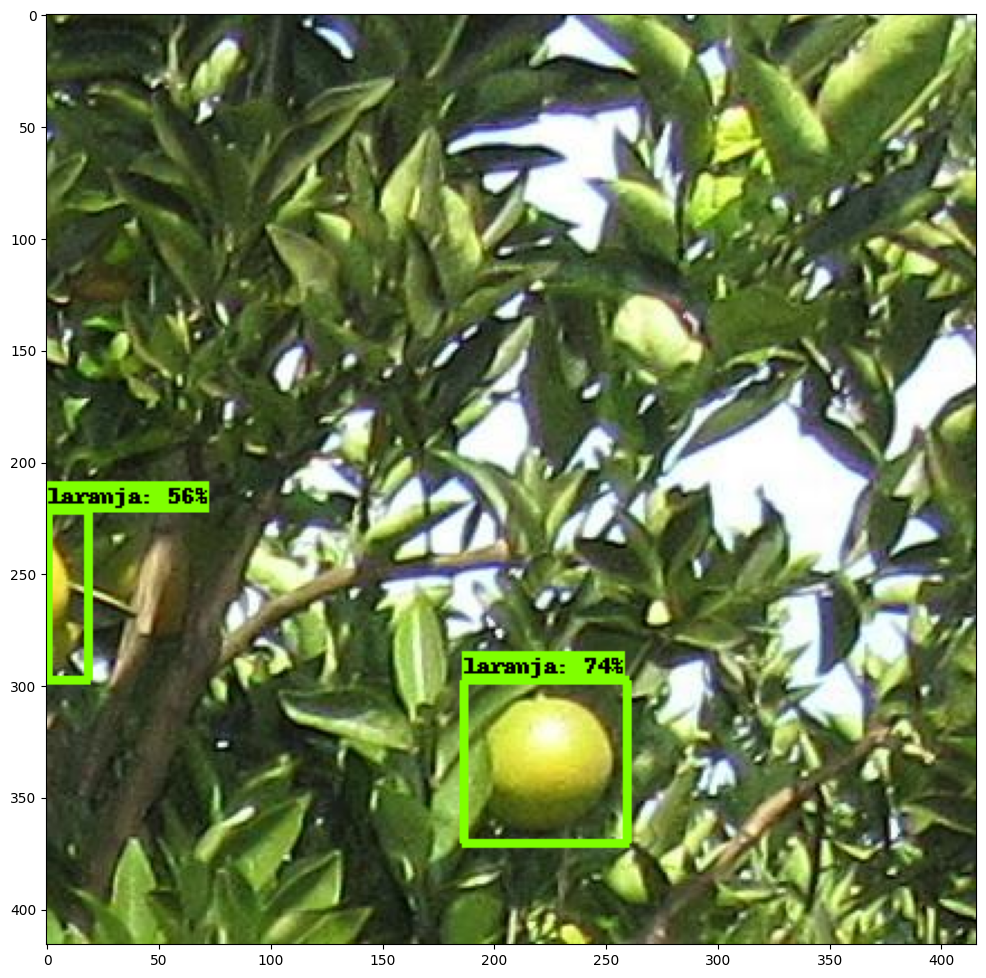

In [ ]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
import random

TEST_IMAGE_PATHS = glob.glob('/content/gdrive/MyDrive/Datasets/Imagens teste/1412--3-_24_jpg.rf.b8b42c866f461ce668aa155d0279b1ec.jpg')
#image_path = random.choice(TEST_IMAGE_PATHS)
#image_np = load_image_into_numpy_array(image_path)

for image in TEST_IMAGE_PATHS:
  image_np = load_image_into_numpy_array(image)

  # Things to try:
  # Flip horizontally
  # image_np = np.fliplr(image_np).copy()

  # Convert image to grayscale
  # image_np = np.tile(
  #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

  input_tensor = tf.convert_to_tensor(np.expand_dims(image_np, 0), dtype=tf.float32)
  detections, predictions_dict, shapes = detect_fn(input_tensor)

  label_id_offset = 1
  image_np_with_detections = image_np.copy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.5,
        agnostic_mode=False,
  )

  plt.figure(figsize=(12,16))
  plt.imshow(image_np_with_detections)
  plt.show()

## Step 9 - Video Test

In [ ]:
# Upload file/s
def upload():
  from google.colab import files
  uploaded = files.upload()
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

In [ ]:
# Call Upload Method
upload()

In [ ]:
from google.colab.patches import cv2_imshow
from imutils.video import FPS

category_idx = label_map_util.create_category_index_from_labelmap(label_map_path, use_display_name=True)

cap = cv2.VideoCapture("/content/gdrive/MyDrive/Object_Detection/Test_Images/videoplayback.mp4")

# Get the Default resolutions
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Define the codec and filename.
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter('output.mp4', fourcc, 20.0, (frame_width, frame_height))

fps = FPS().start()

def run_inference(cap):
    while cap.isOpened():
        ret, frame = cap.read()

        if ret:
          # Resize frame
          #image_np = cv2.resize(frame, (800, 600),interpolation = cv2.INTER_AREA)

          # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
          image_np_expanded = np.expand_dims(frame, axis=0)

          input_tensor = tf.convert_to_tensor(image_np_expanded, dtype=tf.float32)
          detections, predictions_dict, shapes = detect_fn(input_tensor)

          label_id_offset = 1
          image_np_with_detections = frame.copy()

          # Visualization of the results of a detection.
          viz_utils.visualize_boxes_and_labels_on_image_array(
              image_np_with_detections,
              detections['detection_boxes'][0].numpy(),
              (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
              detections['detection_scores'][0].numpy(),
              category_idx,
              use_normalized_coordinates=True,
              max_boxes_to_draw=200,
              min_score_thresh=.5,
              agnostic_mode=False,
          )

          # Display output
          #cv2_imshow(cv2.resize(image_np_with_detections, (800, 600)))
          out.write(cv2.resize(image_np_with_detections, (frame_width, frame_height)))
          fps.update()

        else:
          break;

run_inference(cap)
fps.stop()

# Release after done iteration through all frames
cap.release()
out.release()

print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))